# **Ship Detection in Satellite Image**

## **Import Modules**

In [0]:
import json, sys, random
import numpy as np
import pandas as pd
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import load_model
import tensorflow.keras.callbacks
from PIL import Image, ImageDraw 
from matplotlib import pyplot as plt
#from google.colab import drive
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


## **Dataset**

**We uploaded dataset on google drive because it is easy to mount drive with google colab and work. If you want to run in jupyter notbook then don't run this cell.**

In [0]:
#drive.mount('/content/gdrive')
#%cd ./gdrive/My Drive/ACV

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive
/content/gdrive/My Drive/ACV


**Load *shipsnet.json* file which contains *data, label, scene_ids and location* lists.**

**Here json.load() will return dictionary.**


In [0]:
f = open(r'shipsnet.json')
dataset = json.load(f)
f.close()

In [0]:
type(dataset)

dict

## **Exploratory Data Analysis (EDA)**

**Convert the data into Pandas dataframe**

In [0]:
ship = pd.DataFrame(dataset)

In [0]:
ship.head(5)

,data,labels,locations,scene_ids
0,"[82, 89, 91, 87, 89, 87, 86, 86, 86, 86, 84, 8...",1,"[-118.2254694333423, 33.73803725920789]",20180708_180909_0f47
1,"[76, 75, 67, 62, 68, 72, 73, 73, 68, 69, 69, 6...",1,"[-122.33222866289329, 37.7491755586813]",20170705_180816_103e
2,"[125, 127, 129, 130, 126, 125, 129, 133, 132, ...",1,"[-118.14283073363218, 33.736016066914175]",20180712_211331_0f06
3,"[102, 99, 113, 106, 96, 102, 105, 105, 103, 10...",1,"[-122.34784341495181, 37.76648707436548]",20170609_180756_103a
4,"[78, 76, 74, 78, 79, 79, 79, 82, 86, 85, 83, 8...",1,"[-122.34852408322172, 37.75878462398653]",20170515_180653_1007


In [0]:
ship.tail(5)

,data,labels,locations,scene_ids
3995,"[126, 122, 124, 138, 165, 186, 195, 199, 203, ...",0,"[-122.08693255500694, 37.77781408256089]",20170815_180821_102d
3996,"[130, 134, 139, 128, 117, 126, 141, 147, 142, ...",0,"[-122.10549691828378, 37.76946626247702]",20170730_191230_0f21
3997,"[171, 135, 118, 140, 145, 144, 154, 165, 139, ...",0,"[-122.48298739296371, 37.684929808845375]",20161116_180804_0e14
3998,"[85, 90, 94, 95, 94, 92, 93, 96, 93, 94, 94, 9...",0,"[-122.29028216570079, 37.71632091139081]",20170211_181116_0e16
3999,"[122, 122, 126, 126, 142, 153, 174, 190, 185, ...",0,"[-122.49531387721586, 37.698557210117706]",20180206_184438_1043


**Let's look into data.**

In [0]:
ship.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   data       4000 non-null   object
 1   labels     4000 non-null   int64 
 2   locations  4000 non-null   object
 3   scene_ids  4000 non-null   object
dtypes: int64(1), object(3)
memory usage: 125.1+ KB


**Understand the distribution better.**

Text(0.5, 1.0, 'Number of NoShip and Ship images')

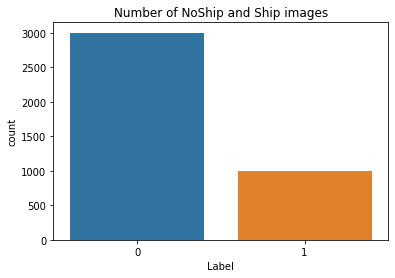

In [0]:
sns.countplot(ship.labels)
plt.xlabel('Label')
plt.title('Number of NoShip and Ship images')

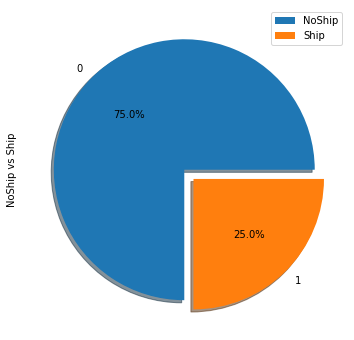

In [0]:
pd.Series(dataset["labels"]).value_counts().plot(kind = 'pie', explode = [0, 0.1], figsize = (6, 6), autopct = '%1.1f%%', shadow = True)
plt.ylabel("NoShip vs Ship")
plt.legend(["NoShip", "Ship"])
plt.show()

In [0]:
print('Total number of images: {}'.format(len(ship.labels)))
print('Number of NoShip Images: {}'.format(np.sum(ship.labels==0)))
print('Number of Ship Images: {}'.format(np.sum(ship.labels==1)))
print('Percentage of positive images: {:.2f}%'.format(100*np.mean(ship.labels)))

Total number of images: 4000
Number of NoShip Images: 3000
Number of Ship Images: 1000
Percentage of positive images: 25.00%


## **Data Preprocessing**

In [0]:
input_data = np.array(dataset['data']).astype('uint8')
output_label = np.array(dataset['labels']).astype('uint8')

**There are total 4000 images.**

**The pixel value data for each 80x80 RGB image is stored as a list of 19200 integers within the data list. The first 6400 entries contain the red channel values, the next 6400 the green, and the final 6400 the blue. The image is stored in row-major order, so that the first 80 entries of the array are the red channel values of the first row of the image.**

In [0]:
spectrum = 3
size = 80
X = input_data.reshape([-1,spectrum,size,size]).transpose([0,2,3,1])

In [0]:
print("Data Shape",input_data.shape)
print('Reshaped Data Shape',X.shape)

Data Shape (4000, 19200)
Reshaped Data Shape (4000, 80, 80, 3)


**Let's see Ship image.**

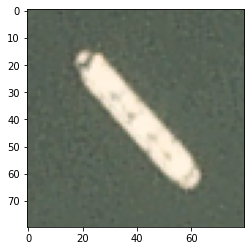

In [0]:
plt.imshow(X[0])

**Random NoShip image.**

0


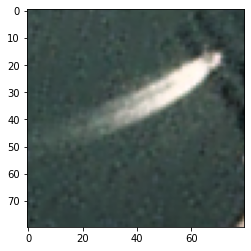

In [0]:
plt.imshow(X[3250])
print(output_label[3250])

**Convert output label into binary class matrix.**

In [0]:
y = to_categorical(output_label, num_classes=2)
y[:5]

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.]], dtype=float32)

In [0]:
print('Labels Shape',output_label.shape)
print('Reshaped Labels Shape',y.shape)

Labels Shape (4000,)
Reshaped Labels Shape (4000, 2)


**Shuffle indexes for better result.**

In [0]:
np.random.seed(42)

In [0]:
index = np.arange(4000)
np.random.shuffle(index)

In [0]:
X_train = X[index]
y_train = y[index]

In [0]:
X_train = X_train/255

## **Convolutional neural network (CNN)**

**Define the CNN structure.**

In [0]:
def CNN():
  model = Sequential()
  
  model.add(Conv2D(32, (3, 3), padding='same', input_shape=(80, 80, 3), activation='relu'))
  model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Dropout(0.25))

  model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
  model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2))) 
  model.add(Dropout(0.25))

  model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
  model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2))) 
  model.add(Dropout(0.25))

  model.add(Conv2D(32, (10, 10), padding='same', activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2))) 
  model.add(Dropout(0.25))

  model.add(Flatten())
  model.add(Dense(512, activation='relu'))
  model.add(Dropout(0.5))

  model.add(Dense(2, activation='softmax'))
  return model

**Print summary and Compile.**

In [0]:
model = CNN()
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 80, 80, 32)        896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 80, 80, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 40, 40, 32)        9248      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 40, 40, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 32)       

In [0]:
sgd = SGD(lr=0.01, momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy',optimizer=sgd,metrics=['accuracy'])

**Here I used ModelCheckPoint and EarlyStopping to halt the training of Neural Network at the right time and get the best model.**

In [0]:
checkpoint = ModelCheckpoint("cnn.h5", monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
early = EarlyStopping(monitor='val_loss', min_delta=0, patience=8, verbose=1, mode='auto')

**Train Neural Network.**

In [0]:
history = model.fit(X_train, y_train, batch_size=32, epochs=18, validation_split=0.2, verbose=1 , callbacks=[checkpoint,early])

Train on 3200 samples, validate on 800 samples
Epoch 1/18
3200/3200 [==============================] - 9s 3ms/step - loss: 0.5069 - accuracy: 0.7691 - val_loss: 0.2927 - val_accuracy: 0.8863

Epoch 00001: val_loss improved from inf to 0.29267, saving model to cnn.h5
Epoch 2/18
3200/3200 [==============================] - 3s 785us/step - loss: 0.2608 - accuracy: 0.8891 - val_loss: 0.2257 - val_accuracy: 0.9225

Epoch 00002: val_loss improved from 0.29267 to 0.22571, saving model to cnn.h5
Epoch 3/18
3200/3200 [==============================] - 3s 794us/step - loss: 0.1997 - accuracy: 0.9153 - val_loss: 0.1146 - val_accuracy: 0.9625

Epoch 00003: val_loss improved from 0.22571 to 0.11460, saving model to cnn.h5
Epoch 4/18
3200/3200 [==============================] - 3s 810us/step - loss: 0.1616 - accuracy: 0.9384 - val_loss: 0.0930 - val_accuracy: 0.9762

Epoch 00004: val_loss improved from 0.11460 to 0.09296, saving model to cnn.h5
Epoch 5/18
3200/3200 [==============================] -

**Loss Curve**

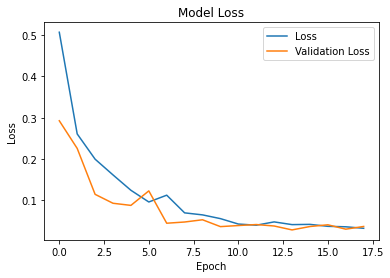

In [0]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("Model Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(["Loss","Validation Loss"])
plt.show()

**Accuracy Curve**

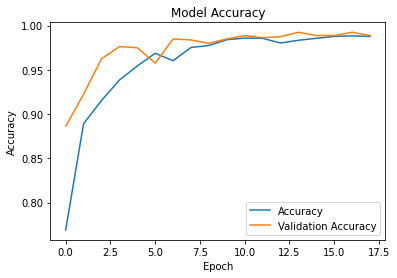

In [0]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title("Model Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy","Validation Accuracy"])
plt.show()

## **Testing**

**Get satellite image for testing.**

In [0]:
testImage = Image.open('scenes/sfbay_1.png')
p = testImage.load()

In [0]:
spectrum = 3
width = testImage.size[0]
height = testImage.size[1]

In [0]:
picVector = []
for channel in range(spectrum):
    for y in range(height):
        for x in range(width):
            picVector.append(p[x, y][channel])

In [0]:
picVector = np.array(picVector).astype('uint8')
picTensor = picVector.reshape([spectrum, height, width]).transpose(1,2,0)

In [0]:
picTensor.shape

(1777, 2825, 3)

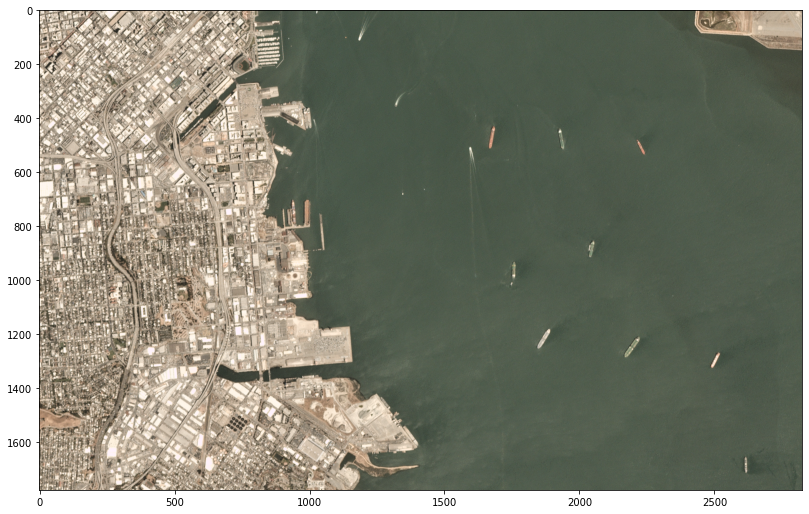

In [0]:
plt.figure(1, figsize=(15,30))
plt.subplot(3,1,1)
plt.imshow(picTensor)
plt.show()

In [0]:
picTensor = picTensor.transpose(2,0,1)

In [0]:
picTensor.shape

(3, 1777, 2825)

**Search on the image. It will take around 20 minutes to generate the final output.**

In [0]:
def cutting(x, y):
    area_study = np.arange(3*80*80).reshape(3, 80, 80)
    for i in range(80):
        for j in range(80):
            area_study[0][i][j] = picTensor[0][y+i][x+j]
            area_study[1][i][j] = picTensor[1][y+i][x+j]
            area_study[2][i][j] = picTensor[2][y+i][x+j]
    area_study = area_study.reshape([-1, 3, 80, 80])
    area_study = area_study.transpose([0,2,3,1])
    area_study = area_study / 255
    sys.stdout.write('\rX:{0} Y:{1}  '.format(x, y))
    return area_study

In [0]:
def not_near(x, y, s, coordinates):
    result = True
    for e in coordinates:
        if x+s > e[0][0] and x-s < e[0][0] and y+s > e[0][1] and y-s < e[0][1]:
            result = False
    return result

In [0]:
def show_ship(x, y, acc, thickness=5):   
    for i in range(80):
        for ch in range(3):
            for th in range(thickness):
                picTensor[ch][y+i][x-th] = -1

    for i in range(80):
        for ch in range(3):
            for th in range(thickness):
                picTensor[ch][y+i][x+th+80] = -1
        
    for i in range(80):
        for ch in range(3):
            for th in range(thickness):
                picTensor[ch][y-th][x+i] = -1
        
    for i in range(80):
        for ch in range(3):
            for th in range(thickness):
                picTensor[ch][y+th+80][x+i] = -1

X:810 Y:10  [[0.01114477 0.9888552 ]]


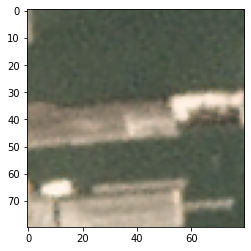

X:1640 Y:420  [[0.00610524 0.99389476]]


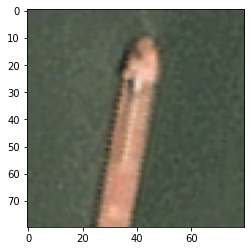

X:1890 Y:430  [[0.01791142 0.9820886 ]]


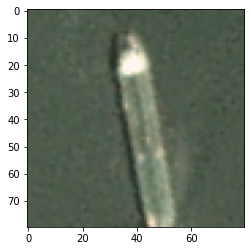

X:2180 Y:460  [[0.04423305 0.955767  ]]


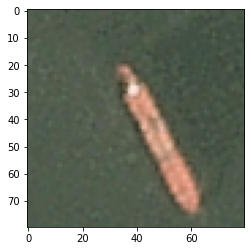

X:970 Y:850  [[0.09604275 0.9039573 ]]


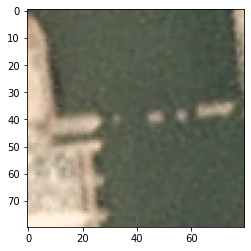

X:2000 Y:850  [[0.02686273 0.9731373 ]]


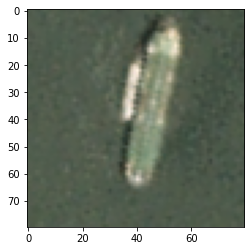

X:1000 Y:1140  [[0.08040849 0.91959155]]


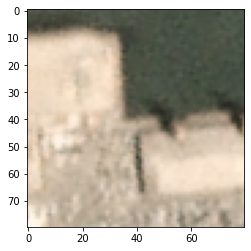

X:1830 Y:1180  [[0.01636945 0.98363054]]


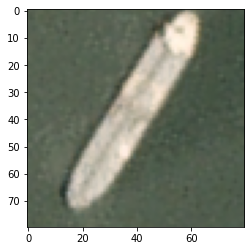

X:2160 Y:1200  [[0.01225917 0.9877408 ]]


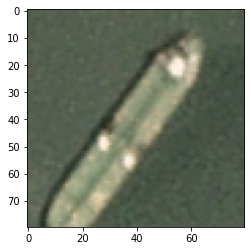

X:2460 Y:1250  [[0.02083222 0.9791678 ]]


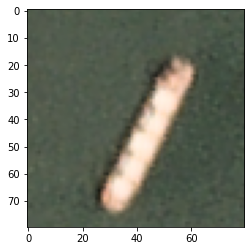

X:980 Y:1270  [[0.00987034 0.99012965]]


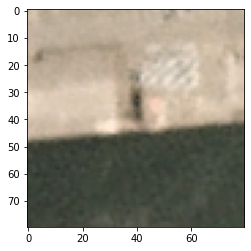

X:1230 Y:1410  [[0.0160815  0.98391855]]


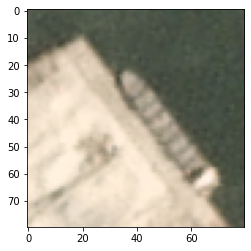

X:1340 Y:1580  [[0.09852552 0.90147454]]


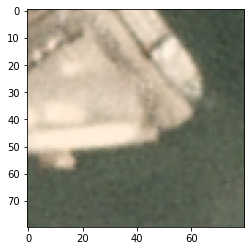

X:1210 Y:1650  [[0.09730618 0.9026938 ]]


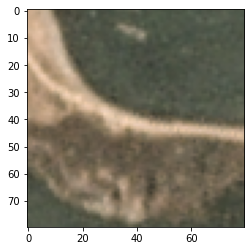

X:2740 Y:1690  CPU times: user 14min 55s, sys: 13.8 s, total: 15min 8s
Wall time: 14min 47s


In [0]:
%%time
step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

In [0]:
for e in coordinates:
  show_ship(e[0][0], e[0][1], e[1][0])

In [0]:
picTensor = picTensor.transpose(1,2,0)
picTensor.shape

(1777, 2825, 3)

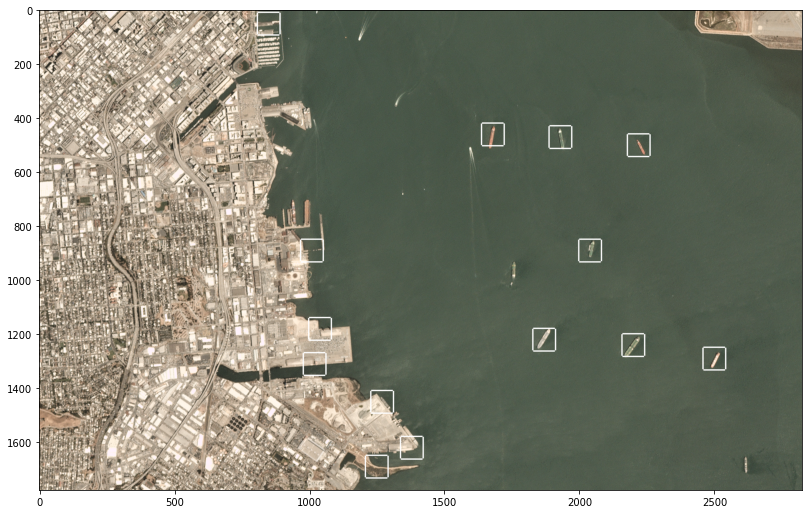

In [0]:
plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picTensor)

plt.show()

**Let's test saved model "cnn.h5" and analyze the result.**

In [0]:
best_model = load_model('cnn.h5')

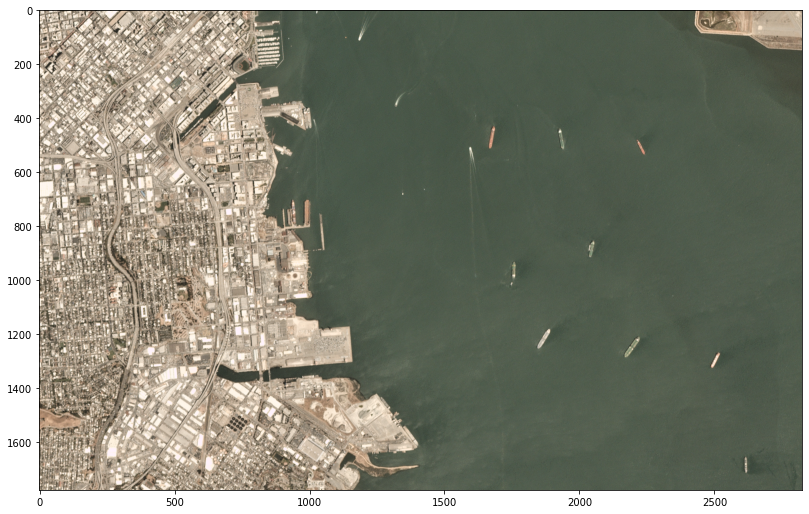

(3, 1777, 2825)

In [0]:
testImage = Image.open('scenes/sfbay_1.png')
p = testImage.load()
spectrum = 3
width = testImage.size[0]
height = testImage.size[1]
picVector = []
for channel in range(spectrum):
    for y in range(height):
        for x in range(width):
            picVector.append(p[x, y][channel])
picVector = np.array(picVector).astype('uint8')
picTensor = picVector.reshape([spectrum, height, width]).transpose(1,2,0)
plt.figure(1, figsize=(15,30))
plt.subplot(3,1,1)
plt.imshow(picTensor)
plt.show()
picTensor = picTensor.transpose(2,0,1)
picTensor.shape

X:800 Y:10  [[0.03805851 0.9619415 ]]


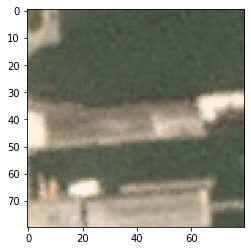

X:2470 Y:40  [[0.03750212 0.9624979 ]]


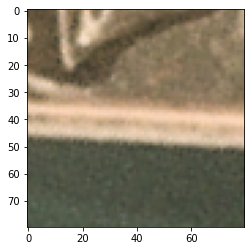

X:2560 Y:50  [[0.01667767 0.9833224 ]]


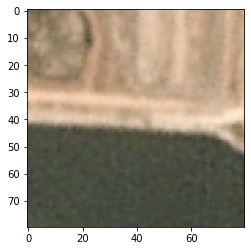

X:2730 Y:100  [[0.06907174 0.9309283 ]]


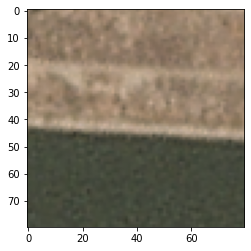

X:1640 Y:420  [[0.00178517 0.99821484]]


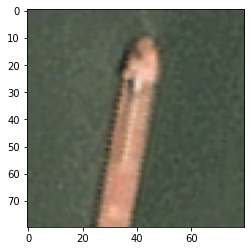

X:1890 Y:430  [[0.00483145 0.99516857]]


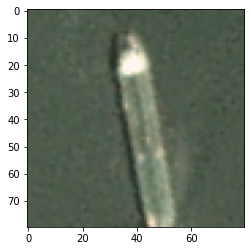

X:2180 Y:460  [[0.06165746 0.9383426 ]]


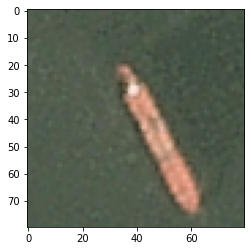

X:910 Y:760  [[0.07256559 0.9274344 ]]


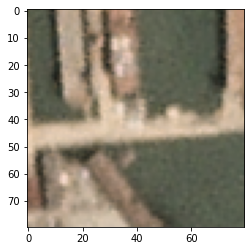

X:2000 Y:840  [[0.02116768 0.97883236]]


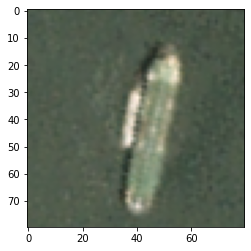

X:960 Y:850  [[0.0220875  0.97791255]]


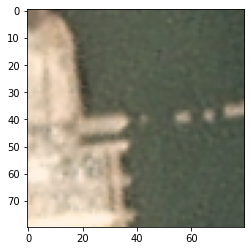

X:1710 Y:920  [[0.06481265 0.93518734]]


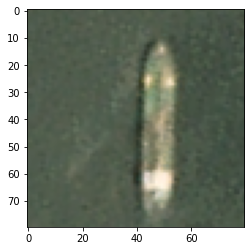

X:940 Y:1020  [[0.05479831 0.94520164]]


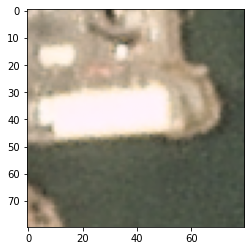

X:1830 Y:1170  [[0.02896175 0.9710382 ]]


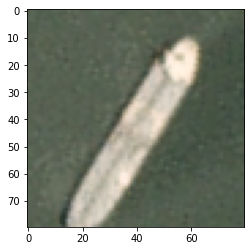

X:2160 Y:1200  [[0.0131338 0.9868662]]


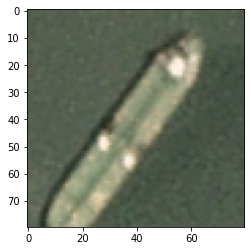

X:2460 Y:1250  [[0.09410754 0.9058925 ]]


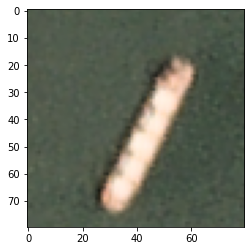

X:1050 Y:1260  [[0.04090086 0.9590991 ]]


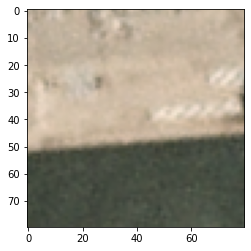

X:940 Y:1270  [[0.01222944 0.98777056]]


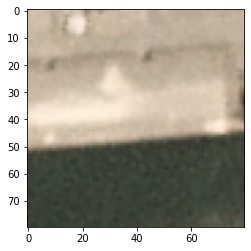

X:1340 Y:1580  [[0.02334253 0.9766575 ]]


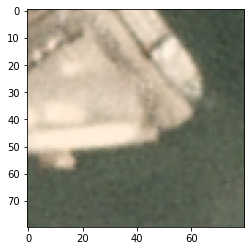

X:2570 Y:1640  [[0.09764524 0.90235484]]


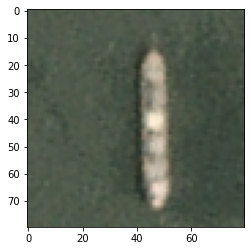

X:1220 Y:1650  [[0.09108035 0.9089197 ]]


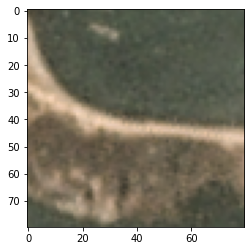

X:2740 Y:1690  CPU times: user 14min 52s, sys: 13.9 s, total: 15min 6s
Wall time: 14min 45s


In [0]:
%%time
step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = best_model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

In [0]:
for e in coordinates:
  show_ship(e[0][0], e[0][1], e[1][0])

In [0]:
picTensor = picTensor.transpose(1,2,0)
picTensor.shape

(1777, 2825, 3)

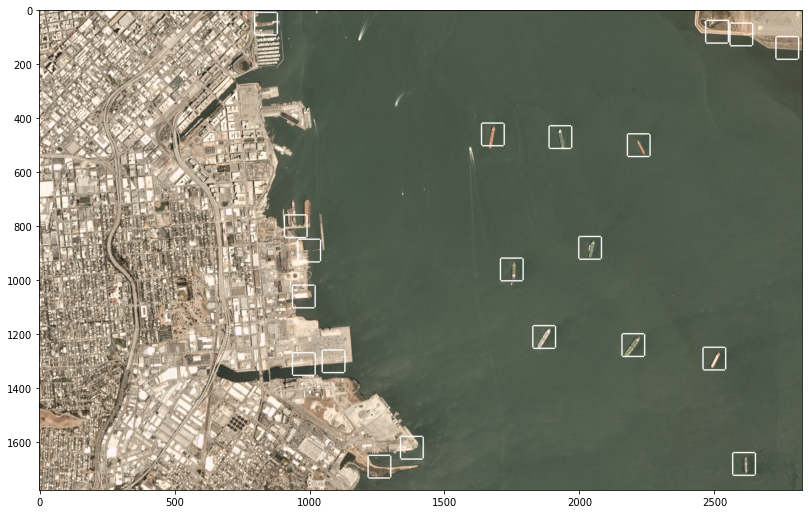

In [0]:
plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picTensor)

plt.show()

## **Hyperparameter Tuning using GridSearchCV**

**I did Hyperparameter tuning using GridSearchCV by taking below parameters.**
*   **activation = [ 'relu', 'tanh', 'softmax']**
*   **optimizer = ['SGD', 'RMSprop', 'Adam']**
*   **dropout_rate = [0.2, 0.25, 0.3]**

In [0]:
def CNN_Tune(activation='relu', dropout_rate=0.20, optimizer='SGD'):
  model1 = Sequential()
  
  model1.add(Conv2D(32, (3, 3), padding='same', input_shape=(80, 80, 3), activation='relu'))
  model1.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
  model1.add(MaxPooling2D(pool_size=(2, 2)))
  model1.add(Dropout(0.25))

  model1.add(Conv2D(32, (3, 3), padding='same', activation=activation))
  model1.add(Conv2D(32, (3, 3), padding='same', activation=activation))
  model1.add(MaxPooling2D(pool_size=(2, 2))) 
  model1.add(Dropout(dropout_rate))

  model1.add(Conv2D(32, (3, 3), padding='same', activation=activation))
  model1.add(Conv2D(32, (3, 3), padding='same', activation=activation))
  model1.add(MaxPooling2D(pool_size=(2, 2))) 
  model1.add(Dropout(dropout_rate))

  model1.add(Conv2D(32, (10, 10), padding='same', activation=activation))
  model1.add(MaxPooling2D(pool_size=(2, 2))) 
  model1.add(Dropout(dropout_rate))

  model1.add(Flatten())
  model1.add(Dense(512, activation='relu'))
  model1.add(Dropout(0.5))

  model1.add(Dense(2, activation='softmax'))

  model1.summary()
  model1.compile(loss='categorical_crossentropy',optimizer=optimizer,metrics=['accuracy'])
  return model1

In [0]:
model1 = KerasClassifier(build_fn=CNN_Tune, epochs=18, batch_size=32, verbose=1)

**I took CrossValidation parameter cv = 2 here to decrease processing time. Still It will take around 30 minutes. (depends on system)**

In [0]:
%%time
sgd = SGD(lr=0.01, momentum=0.9, nesterov=True)
activation = [ 'relu', 'tanh', 'softmax']
optimizer = [sgd, 'RMSprop', 'Adam']
dropout_rate = [0.2,0.25,0.3]
param_grid = dict(activation=activation, dropout_rate=dropout_rate, optimizer=optimizer)
grid = GridSearchCV(estimator=model1, param_grid=param_grid, cv = 2)
grid_result = grid.fit(X_train, y_train)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 80, 80, 32)        896       
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 80, 80, 32)        9248      
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 40, 40, 32)        9248      
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 40, 40, 32)        9248      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 20, 20, 32)       

**Get the best parameter and best score.**

In [0]:
print("Best: %f using \n%s" % (grid_result.best_score_, grid_result.best_params_))
print("\n\n")
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.985000 using 
{'activation': 'relu', 'dropout_rate': 0.2, 'optimizer': 'Adam'}



0.984750 (0.002250) with: {'activation': 'relu', 'dropout_rate': 0.2, 'optimizer': <keras.optimizers.SGD object at 0x7f87cf245358>}
0.980250 (0.000750) with: {'activation': 'relu', 'dropout_rate': 0.2, 'optimizer': 'RMSprop'}
0.985000 (0.001000) with: {'activation': 'relu', 'dropout_rate': 0.2, 'optimizer': 'Adam'}
0.982000 (0.002500) with: {'activation': 'relu', 'dropout_rate': 0.25, 'optimizer': <keras.optimizers.SGD object at 0x7f87cf245358>}
0.978000 (0.001500) with: {'activation': 'relu', 'dropout_rate': 0.25, 'optimizer': 'RMSprop'}
0.982750 (0.000250) with: {'activation': 'relu', 'dropout_rate': 0.25, 'optimizer': 'Adam'}
0.981500 (0.000500) with: {'activation': 'relu', 'dropout_rate': 0.3, 'optimizer': <keras.optimizers.SGD object at 0x7f87cf245358>}
0.982750 (0.003750) with: {'activation': 'relu', 'dropout_rate': 0.3, 'optimizer': 'RMSprop'}
0.970000 (0.018500) with: {'activation': 'relu'

**Testing**

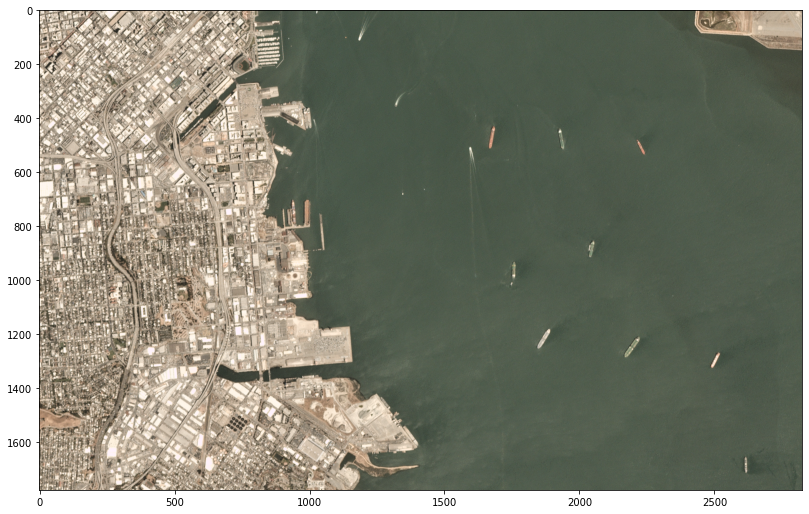

(3, 1777, 2825)

In [0]:
testImage = Image.open('scenes/sfbay_1.png')
p = testImage.load()
spectrum = 3
width = testImage.size[0]
height = testImage.size[1]
picVector = []
for channel in range(spectrum):
    for y in range(height):
        for x in range(width):
            picVector.append(p[x, y][channel])
picVector = np.array(picVector).astype('uint8')
picTensor = picVector.reshape([spectrum, height, width]).transpose(1,2,0)
plt.figure(1, figsize=(15,30))
plt.subplot(3,1,1)
plt.imshow(picTensor)
plt.show()
picTensor = picTensor.transpose(2,0,1)
picTensor.shape

X:2500 Y:40  [1]


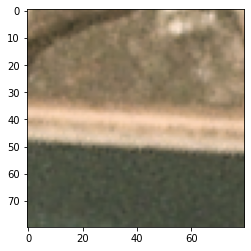

X:960 Y:350  [1]


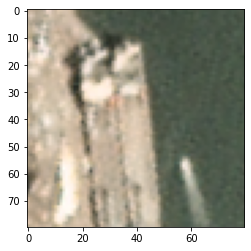

X:1870 Y:380  [1]


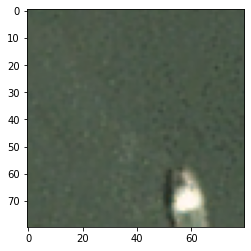

X:1640 Y:420  [1]


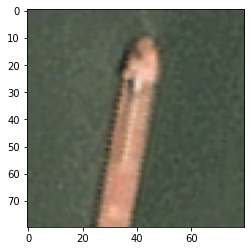

X:2190 Y:470  [1]


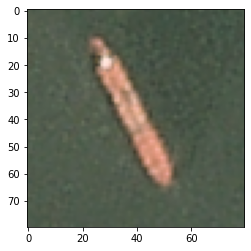

X:950 Y:690  [1]


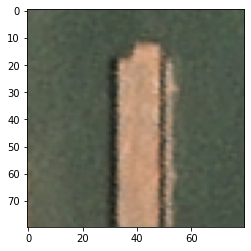

X:910 Y:800  [1]


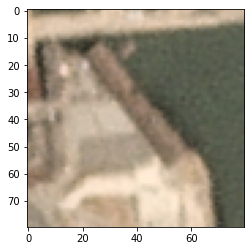

X:1000 Y:850  [1]


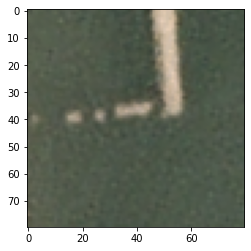

X:2000 Y:850  [1]


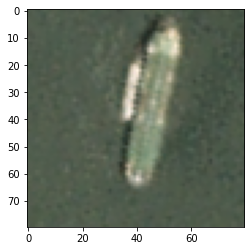

X:1720 Y:920  [1]


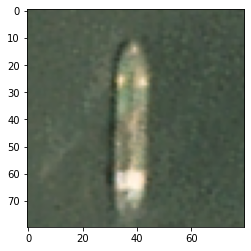

X:920 Y:1100  [1]


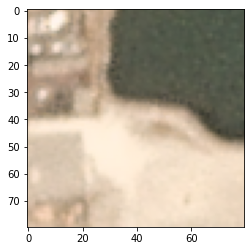

X:1010 Y:1150  [1]


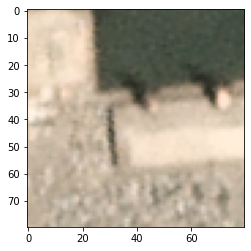

X:1830 Y:1170  [1]


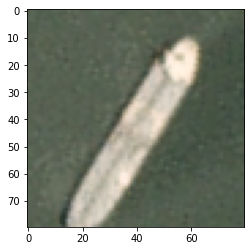

X:2160 Y:1200  [1]


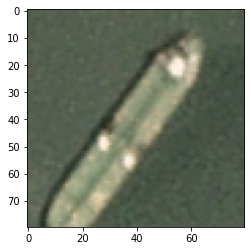

X:2460 Y:1250  [1]


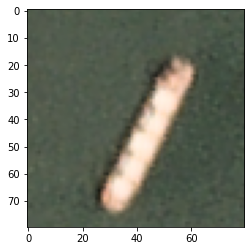

X:880 Y:1280  [1]


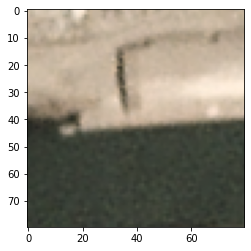

X:1190 Y:1400  [1]


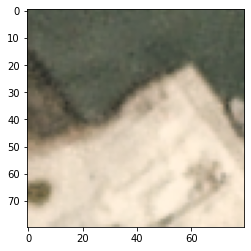

X:1290 Y:1480  [1]


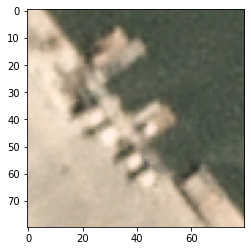

X:2580 Y:1640  [1]


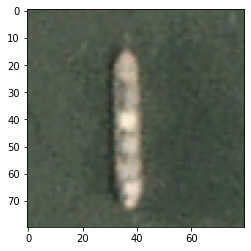

X:1290 Y:1650  [1]


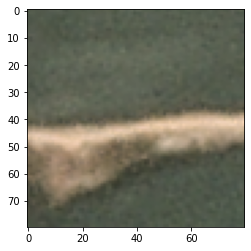

X:2740 Y:1690  

In [0]:
step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = grid_result.best_estimator_.predict(area,verbose=0)
        if result[0] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

In [0]:
for e in coordinates:
  show_ship(e[0][0], e[0][1], e[1][0])

In [0]:
picTensor = picTensor.transpose(1,2,0)
picTensor.shape

(1777, 2825, 3)

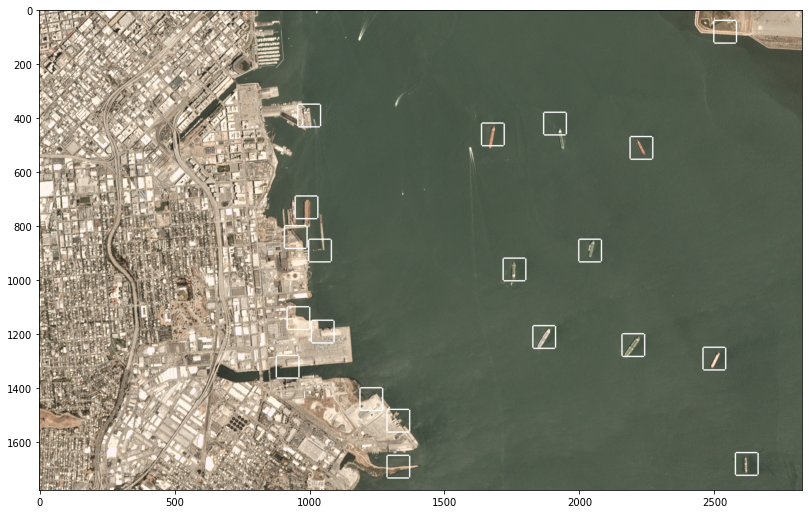

In [0]:
plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picTensor)

plt.show()